In [302]:
%matplotlib inline

import numpy as np
import pyrealsense2 as rs
import cv2
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 300

In [303]:
# create camera intrinsics matrix from recorded data
K = np.array([
    [913.848, 0.0, 642.941],
    [0.0, 913.602, 371.196],
    [0.0, 0.0, 1.0]
])

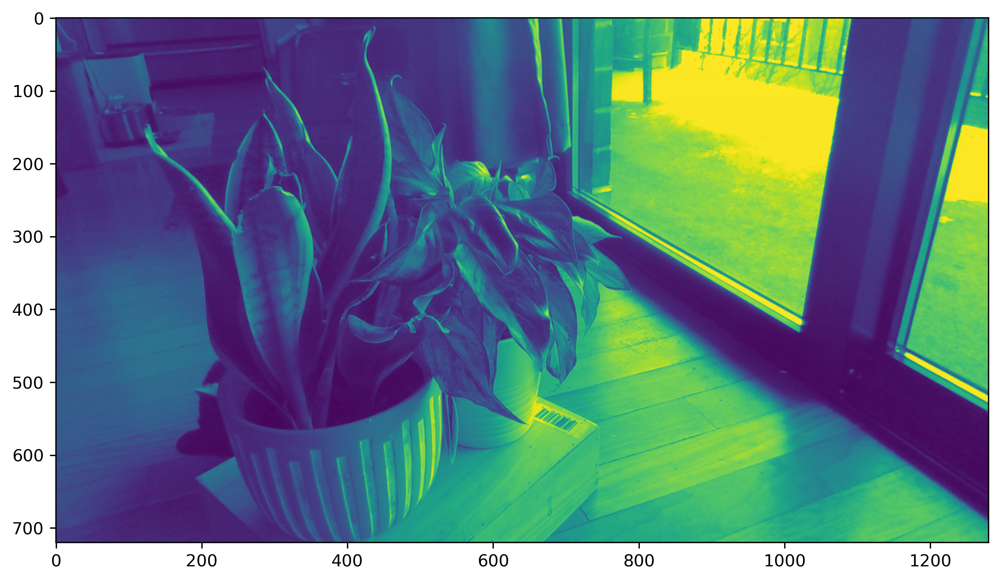

In [304]:
# load images
img0_color = cv2.imread("./capture_0.png")
img1_color = cv2.imread("./capture_1.png")

img0 = cv2.cvtColor(img0_color, cv2.COLOR_BGR2GRAY)
img1 = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)

plt.imshow(img0)

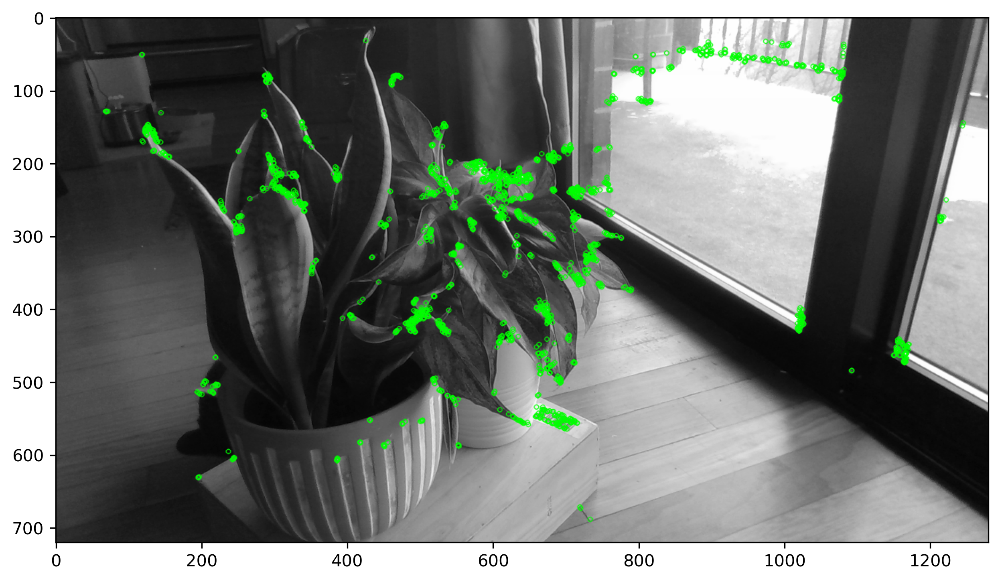

In [305]:
# initialize orb detector
orb = cv2.ORB_create(2000)

# find keypoints in image 0
kp = orb.detect(img0, None)

# compute the descriptors (used for matching)
kp, des = orb.compute(img0, kp)

img0_kp = cv2.drawKeypoints(img0, kp, None, color=(0, 255, 0))

plt.imshow(img0_kp)

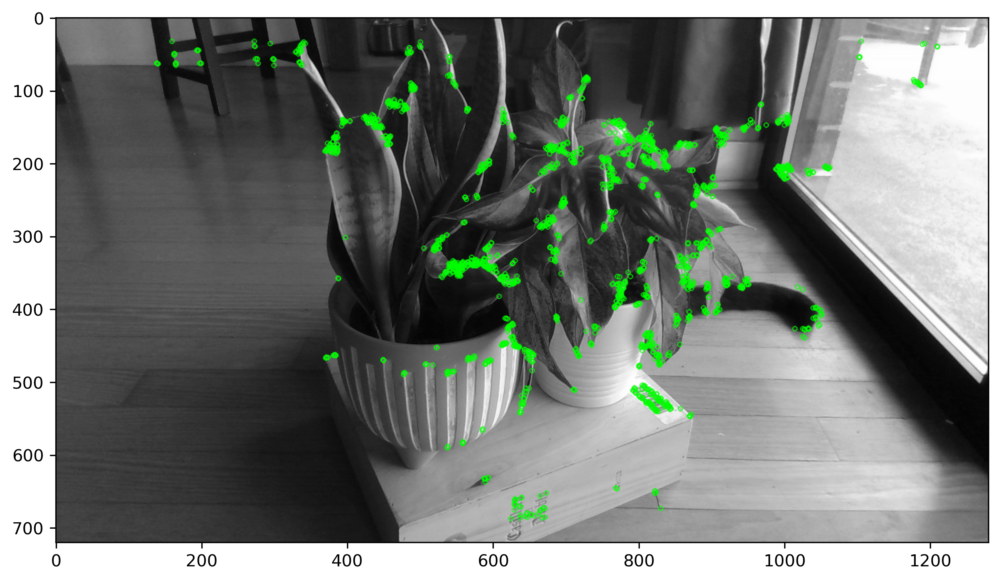

In [306]:
# identify key points in second image
kp1 = orb.detect(img1, None)
kp1, des1 = orb.compute(img1, kp1)

# draw keypoints on second iamge
img1_kp = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0))
plt.imshow(img1_kp)

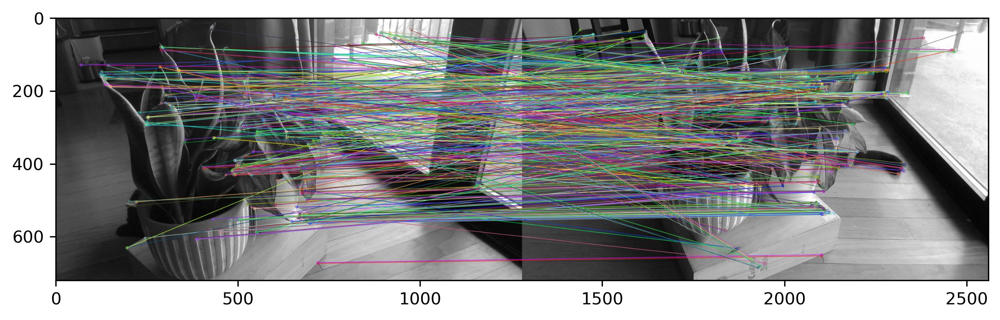

In [307]:
# create brute force matcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# match keypoints and sort the best
matches = bf.match(des, des1)
matches = sorted(matches, key=lambda x: x.distance)

# create matching point pairs
correspondences = [[kp1[match.trainIdx].pt, kp[match.queryIdx].pt]
                   for match in matches]
pts2, pts1 = list(zip(*correspondences))
pts1 = np.int32(pts1)
pts2 = np.int32(pts2)

# draw the best N matches
match_image = cv2.drawMatches(img0, kp, img1, kp1, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(match_image)

In [308]:
# find fundamental matrix
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_LMEDS, 3, 0.99)

# select inliers
pts1 = pts1[mask.ravel() == 1]
pts2 = pts2[mask.ravel() == 1]

# using the points from image 2 find the epilines in image 1
lines1 = cv2.computeCorrespondEpilines(pts2, 2, F)
lines1 = lines1.reshape(-1, 3)


# using the points from image 1 find the epilines in image 2
lines2 = cv2.computeCorrespondEpilines(pts1, 1, F)
lines2 = lines2.reshape(-1, 3)

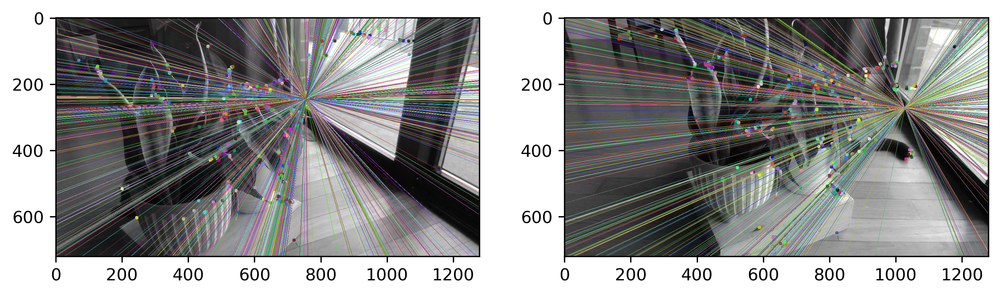

In [309]:
def drawlines(img1, img2, lines, pts1, pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r, c = img1.shape
    img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    for r, pt1, pt2 in zip(lines, pts1, pts2):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        img1 = cv2.line(img1, (x0, y0), (x1, y1), color, 1)
        img1 = cv2.circle(img1, tuple(pt1), 5, color, -1)
        img2 = cv2.circle(img2, tuple(pt2), 5, color, -1)
    return img1, img2

img0_lines = img0.copy()
img1_lines = img1.copy()

img0_l, _ = drawlines(img0_lines, img1_lines, lines1, pts1, pts2)
img1_l, _ = drawlines(img1_lines, img0_lines, lines2, pts2, pts1)

fig, (axl, axr) = plt.subplots(1, 2)
axl.imshow(img0_l)
axr.imshow(img1_l)

In [315]:
# find essential matrix between the two poses
E, o = cv2.findEssentialMat(pts1, pts2, K)
E2 = K.T@F@K
n, R, T, mask = cv2.recoverPose(E=E, points1=pts1, points2=pts2)

print(E)
print(E2)

[[ 0.02808151  0.14291887  0.01117033]
 [ 0.12093092 -0.05439511 -0.6943409 ]
 [ 0.14859237  0.67523875 -0.03068201]]
[[ 1.05158464  2.89334864  0.27232202]
 [-3.89948689  1.40587063  0.67270179]
 [-0.865555   -1.0644685  -0.04153912]]


In [316]:
# create projection matricies for both cameras
P0 = np.hstack([K, np.array([[0, 0, 0]]).T])
P1 = np.hstack([R.T@K, -R.T@T])

pts1 = pts1.astype(float)
pts2 = pts2.astype(float)

points = cv2.triangulatePoints(P0, P1, pts2.T, pts1.T)
points = points.T
points = [p[0:3] / p[3] for p in points]

In [317]:
colors = [img0_color[int(pt[1])][int(pt[0])] for pt in pts1]
colors = np.divide(colors, 255).tolist()

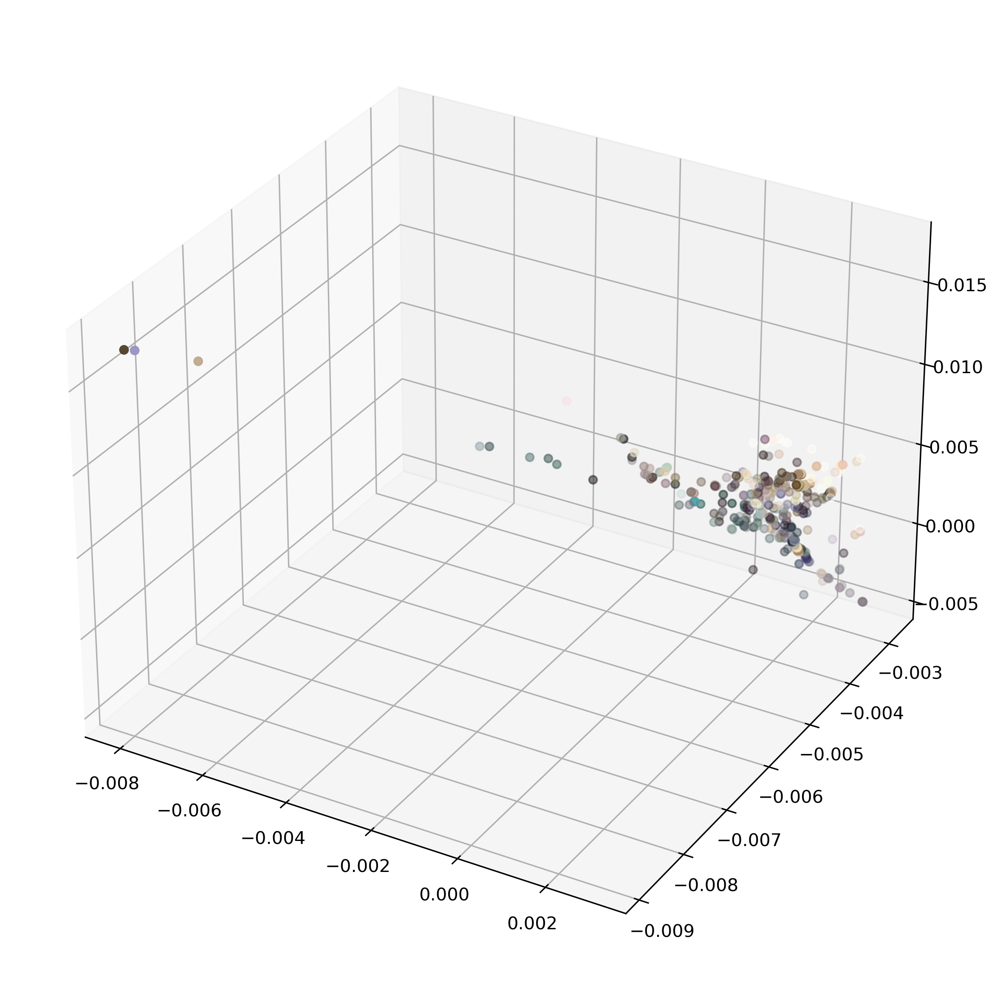

In [318]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

xs, ys, zs = list(zip(*points))
ax.scatter(xs, ys, zs, c=colors)
plt.show()

In [319]:
# write point cloud to file
import csv
with open('cloud.txt', 'w', newline='\n') as file:
    writer = csv.writer(file)
    for pt, color in zip(points, colors):
        writer.writerow([*pt, *color])

